# EDA
The beach litter dataset contains images and masks. 

## 1) Tools for images: 
I will need python libraries and APIs to explore this data. Obviously numpy. I'll discuss the use of the others.

In [1]:
import numpy as np

### 1.1) The glob library 
facilitates making a list of names of files in a directory.

In [2]:
from glob import glob
import os

In [8]:
path = '../beachlitter/'
images = sorted(glob(os.path.join(path, "images/*.jpg"))) # list of strings
masks = sorted(glob(os.path.join(path, "maskpngs/*.png"))) 

In [9]:
type(images), len(images), type(images[0])

(list, 3500, str)

### 1.2 The Python Image Library, PIL (now Pillow)
is nice for dealing with images. 

(Note that the original PIL has not been maintained since 2009, and that it was repackaged as Pillow by a different group. If you install with `pip install pillow`, then you import as `import PIL` even though PIL is refering to pillow. )

In [10]:
import PIL # will imort pillow, still called PIL in the import command for backwards compatability 
# an image
im = PIL.Image.open(images[-1]) #  note that this opens but does not load 
im.mode # RGB mode is default

'RGB'

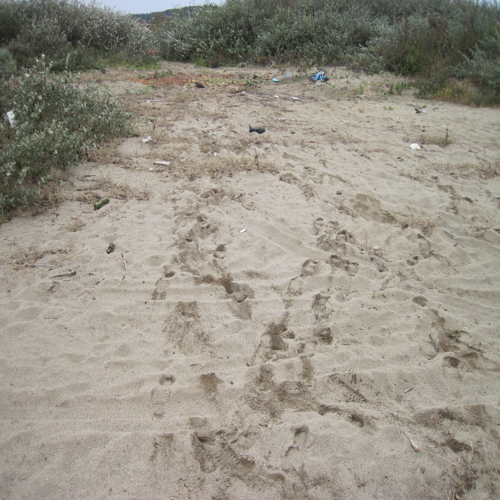

In [11]:
im.resize((500,500))# displays the image at requested size.

In [12]:
# a mask
ma = PIL.Image.open(masks[-1])
ma.mode # pallate mode 'P' is default for .png

'P'

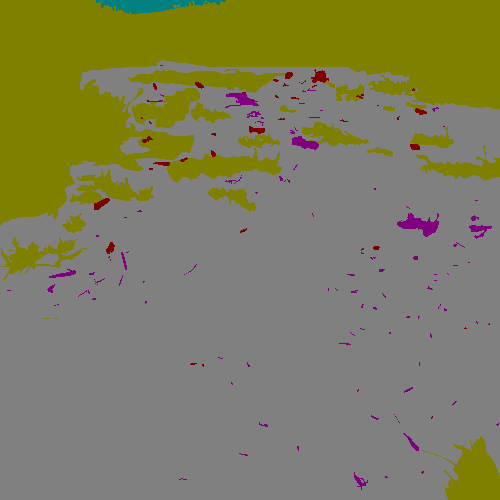

In [13]:
ma.resize((500,500)) # displays the mask in pallate mode. type: PIL.PngImagePlugin.PngImageFile

PIL does not open files as arrays, but rather as PIL objects.

In [14]:
type(im), type(ma)

(PIL.JpegImagePlugin.JpegImageFile, PIL.PngImagePlugin.PngImageFile)

While PIL can read off pixel values, 

In [22]:
print(type(ma.getpixel((0, 0))))
print(type(im.getpixel((0, 0))[0]))
for i in range(5):
    print(ma.getpixel((i, 0)))
for i in range(5):
    print(im.getpixel((i, 0)))

<class 'int'>
<class 'int'>
3
3
3
3
3
(144, 144, 146)
(150, 151, 153)
(154, 159, 162)
(147, 157, 158)
(139, 153, 154)


it is not optimal for changing from images to arrays to use for keras. Keras has an optimized utility.

### 1.3) Keras's `.utils.image_to_array` 
maps images to tensors. In particular, it is mapping the jpegs in my data to RGB tensors, and the masks to integer labeled tensors with 8 labels.

In [23]:
import tensorflow as tf

In [24]:
imar = tf.keras.utils.img_to_array(#documentation says a PIL amage goes in
    im, data_format=None, #chanels first or channels last
    dtype='float32') # np.ndarray of float32s
maar = tf.keras.utils.img_to_array(
    ma, data_format=None, dtype='float32')
# imar.shape, maar.shape, type(imar), type(maar), type(imar[1,1,1]), type(maar[1,1,0]) 
# mask is a tensor of rank3 and shape (x,y,1), image is a tensor of rank 3 and shape (x,y,3)


In [25]:
# 4 pixels worth of each. 
maar[0:2,0:2,0], imar[0:2,0:2,:]

(array([[3., 3.],
        [3., 3.]], dtype=float32),
 array([[[144., 144., 146.],
         [150., 151., 153.]],
 
        [[132., 133., 135.],
         [138., 139., 141.]]], dtype=float32))

### 1.4) pylpot.imshow
To plot an array as in image, use plt.imshow. 

In [26]:
import matplotlib.pyplot as plt

#### 1.4.1) PNG vs Array mask overlays

To apply boolean filter that highlights where trash is, I need to use an array, not a png. That is

- if ma is a png then ma == 1 is undefined

- if maar is array then maar == 1 is a boolean mask with value True at pixels labeled as trash. 

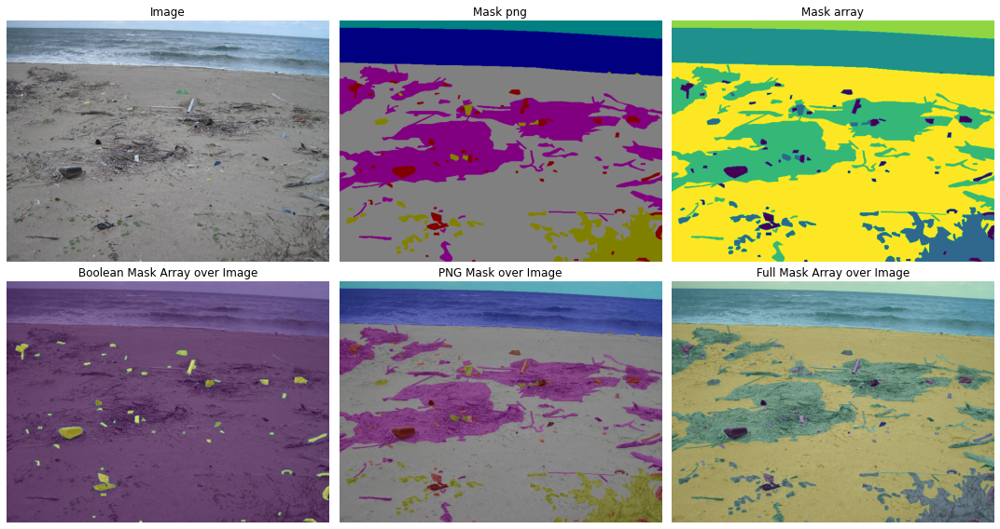

In [33]:
index = 4
im = PIL.Image.open(images[index])
ma = PIL.Image.open(masks[index])
imar = tf.keras.utils.img_to_array(#documentation says a PIL amage goes in
    im, data_format=None, #chanels first or channels last
    dtype='float32') # np.ndarray of float32s
maar = tf.keras.utils.img_to_array(
    ma, data_format=None, dtype='float32')

fig = plt.figure(figsize=(15, 8))
fig.add_subplot(2, 3, 1 )
plt.imshow(imar/255) # input is pillow object, not array: gets confused by rgb inputsarray
plt.title('Image')
plt.axis("off")
fig.add_subplot(2, 3, 2)
plt.imshow(ma) # plots a png
plt.title("Mask png")
plt.axis("off")
fig.add_subplot(2, 3, 3 )
plt.imshow(maar) # plots an array
plt.title("Mask array")
plt.axis("off")

# mask overlay
fig.add_subplot(2, 3, 4 )
plt.imshow(im) # input is pillow object, not array: gets confused by rgb inputsarray
plt.imshow(maar == 1, alpha =.5) 
plt.title("Boolean Mask Array over Image")
plt.axis("off")

fig.add_subplot(2, 3, 5 )
plt.imshow(im) # input is pillow object, not array: gets confused by rgb inputsarray
plt.imshow(ma, alpha =.5) 
plt.title("PNG Mask over Image")
plt.axis("off")

fig.add_subplot(2, 3, 6 )
plt.imshow(imar/255) # input is pillow object im, or array imar/255. Not normalizing does not work! 
plt.imshow(maar, alpha =.3) 
plt.title("Full Mask Array over Image")
plt.axis("off")

plt.tight_layout(); 

#### 1.4.2) Bigger images for examining label quality

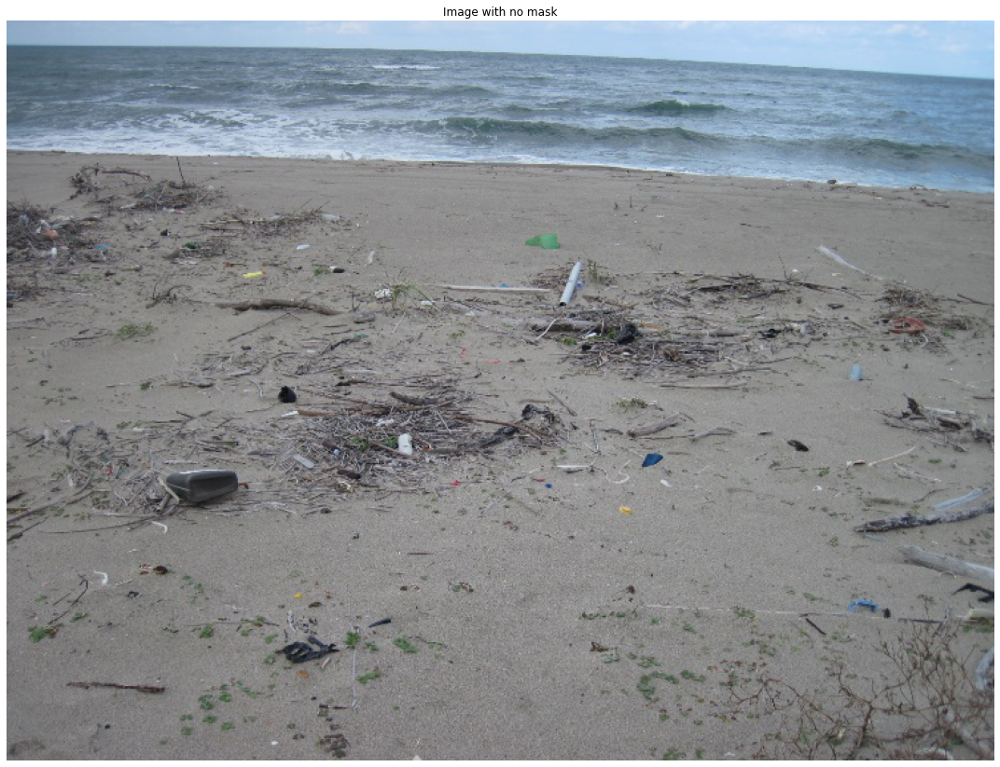

In [34]:
## for zooming in and getting a feel for the hand labeled mask quality
fig = plt.figure(figsize=(15, 15))
plt.imshow(im) # input is pillow object, not array: gets confused by rgb inputsarray
# plt.imshow(maar == 1, alpha =.2) 
plt.title("Image with no mask")
plt.axis("off")
plt.tight_layout(); 

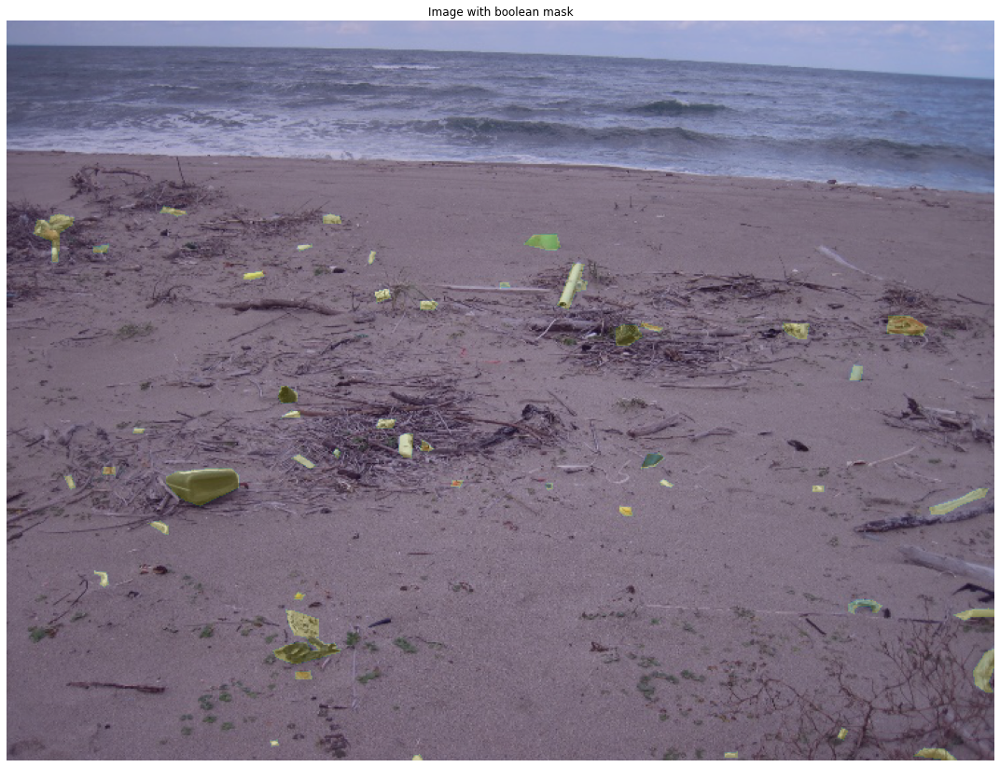

In [35]:
# Bigger version of mask overlay
fig = plt.figure(figsize=(15, 15))
plt.imshow(im) # input is pillow object, not array: gets confused by rgb inputsarray
plt.imshow(maar == 1, alpha =.2) 
plt.title('Image with boolean mask')
plt.axis("off")
plt.tight_layout(); 

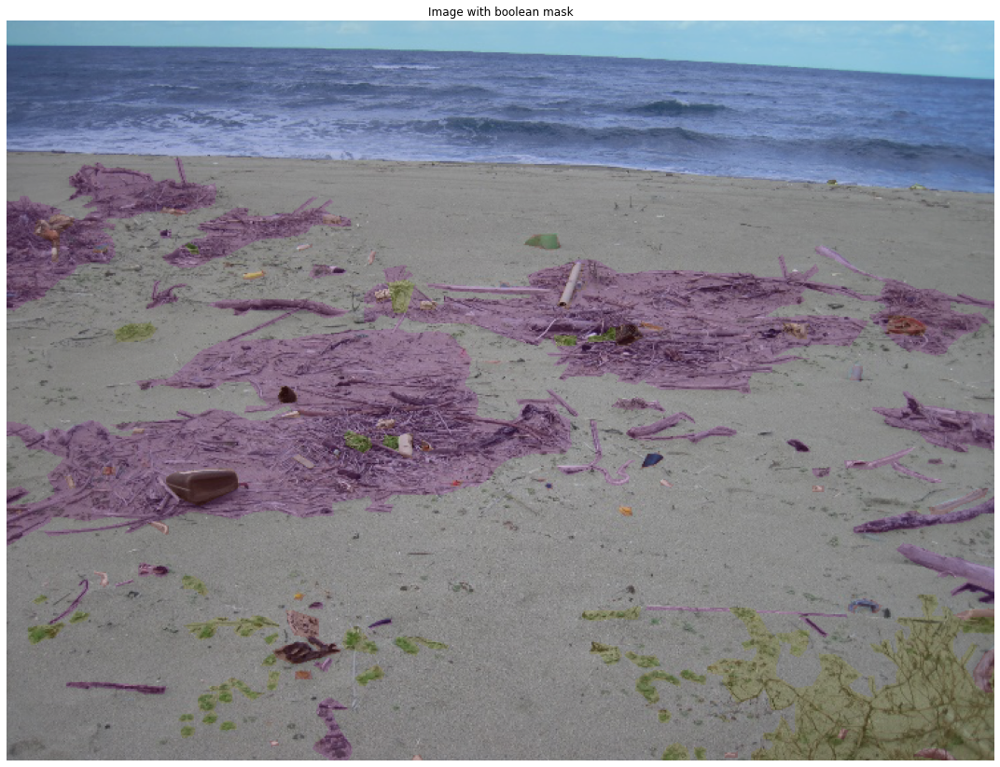

In [39]:
# Bigger version of mask overlay
fig = plt.figure(figsize=(15, 15))
plt.imshow(imar/255) # input is pillow object, not array: gets confused by rgb inputsarray
plt.imshow(ma , alpha =.2) 
plt.title('Image with boolean mask')
plt.axis("off")
plt.tight_layout(); 

#### Unsolved: Make arrays plot with same color as their source pngs

The color scheme clearly changes when going from imshow(PIL_png),  to imshow(array). My predictions will give out arrays. I'd like to be able to perform the reverse map. 

I found a description at <a href="https://stackoverflow.com/questions/10965417/how-to-convert-a-numpy-array-to-pil-image-applying-matplotlib-colormap#10967471">stackoverflow</a>, but it is a little off. 

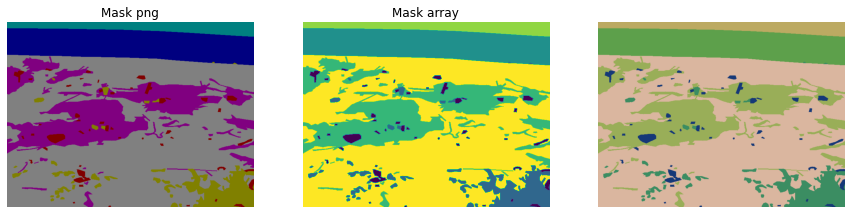

In [44]:
index = 4
im = PIL.Image.open(images[index])
ma = PIL.Image.open(masks[index])
imar = tf.keras.utils.img_to_array(
    im, #documentation says a PIL amage goes in
    data_format=None, #chanels first or channels last
    dtype='float32') # np.ndarray of float32s
maar = tf.keras.utils.img_to_array(ma, data_format=None, dtype='float32')

fig = plt.figure(figsize=(15, 8))
fig.add_subplot(1, 3, 1)
plt.imshow(ma) # plots a png
plt.title("Mask png")
plt.axis("off")
fig.add_subplot(1, 3, 2 )
plt.imshow(maar) # plots an array
plt.title("Mask array")
plt.axis("off")
fig.add_subplot(1, 3, 3 )
from matplotlib import cm
p_from_ar = PIL.Image.fromarray(np.uint8(cm.gist_earth(np.reshape(maar,(maar.shape[0:2]))/8)*255), mode=None)
plt.axis("off")
plt.imshow(p_from_ar);

In [52]:
cmed = cm.gist_earth(np.reshape(maar,(maar.shape[0:2]))/8)
maar.shape, cmed.shape, cmed[0,1,:],  cmed[0,200,3]
# why 4? 


((557, 743, 1),
 (557, 743, 4),
 array([0.74056322, 0.6696508 , 0.38618893, 1.        ]),
 1.0)

In [54]:
uniques = set()
for i in range(557):
    uniques = uniques.union( set(cmed[i,:,3]))
uniques

{1.0}

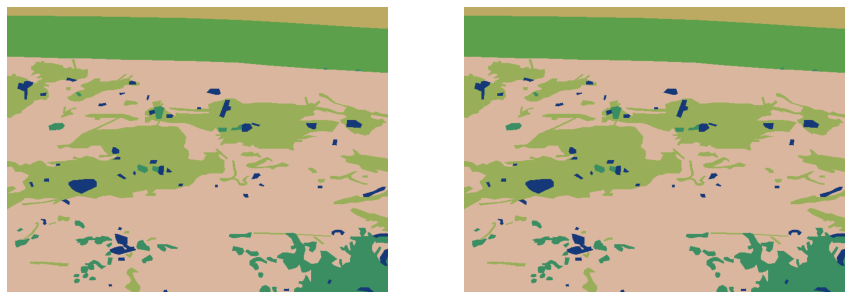

In [59]:
fig = plt.figure(figsize=(15, 8))
fig.add_subplot(1, 2, 1)
plt.axis('off')
plt.imshow(cmed)
fig.add_subplot(1, 2, 2)
plt.axis('off')
plt.imshow(np.reshape(cmed, cmed.shape[0:3]));

So... that 4th component does nothing.... . 

I would like to be cnosistant. 

Q: Does Pillow have an array_to_image function?

A: No, it has `PIL.Image.fromarray(array, mode=None)` 

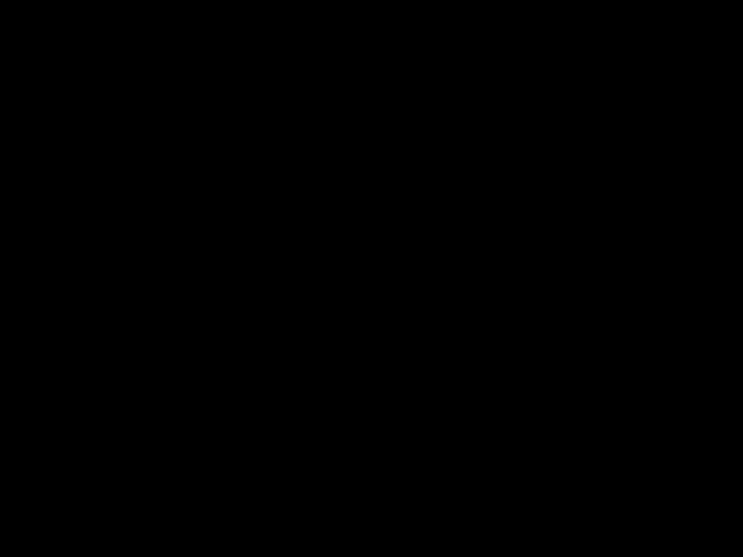

In [68]:
reim = PIL.Image.fromarray(np.reshape(maar, maar.shape[:2]) , mode='P')
reim

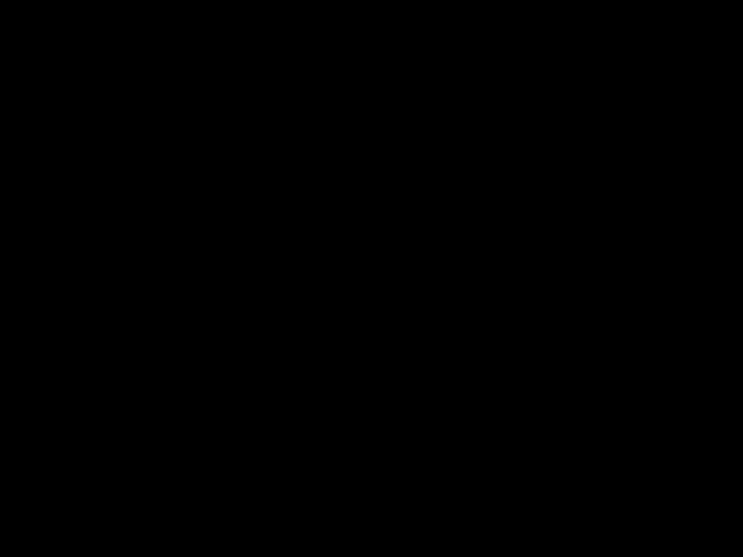

In [64]:
PIL.Image.fromarray(np.uint8(np.reshape(maar, maar.shape[:2])), mode='P')

In [ ]:
maar.shape # ma.shape # does not have shape

In [69]:
type(maar[1,1,0])

numpy.float32

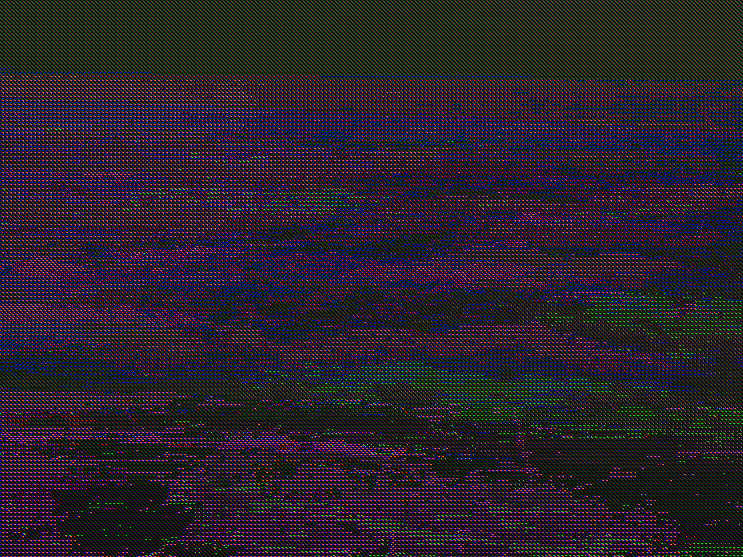

In [62]:
# PIL.Image.fromarray(maar)
PIL.Image.fromarray(imar[:,:,:], "RGB",) # what the hell is that ?! 

How about keras array_to_img

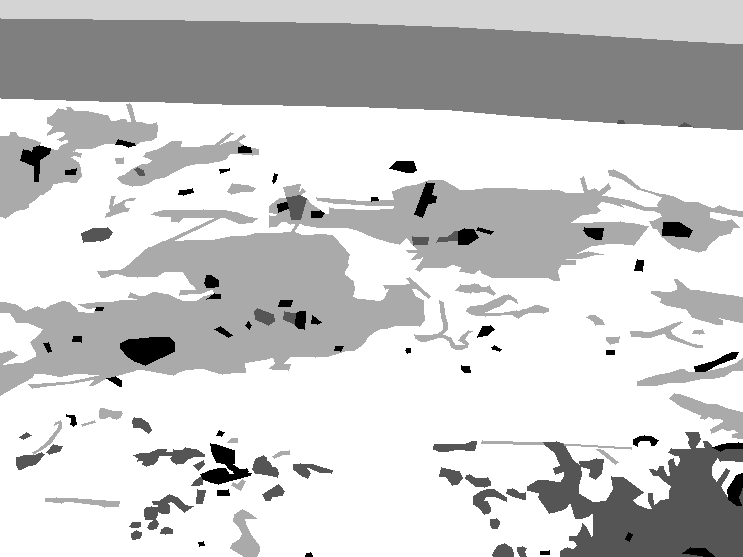

In [71]:
imaar = tf.keras.utils.array_to_img(
    maar, 
    data_format=None,  #channels first or last
    scale=True, #defults 0 to 255
    dtype=None #float32 
)
imaar # greyscale.

Ok, how about something more brute force... 

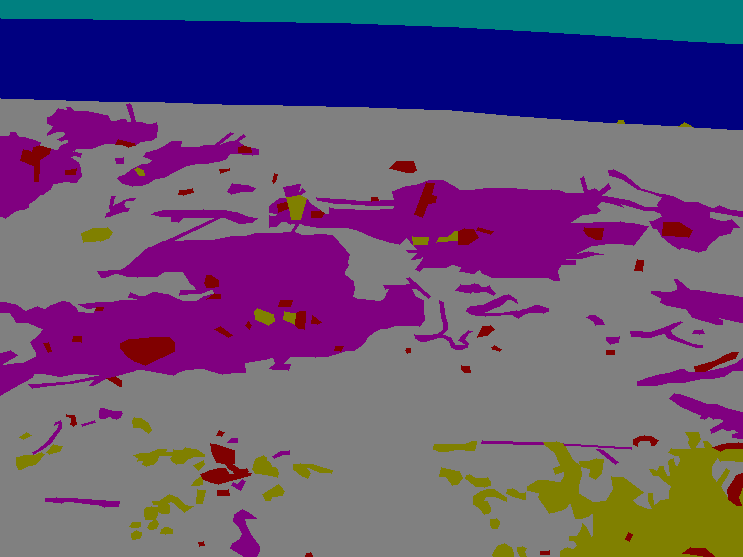

In [89]:
ma

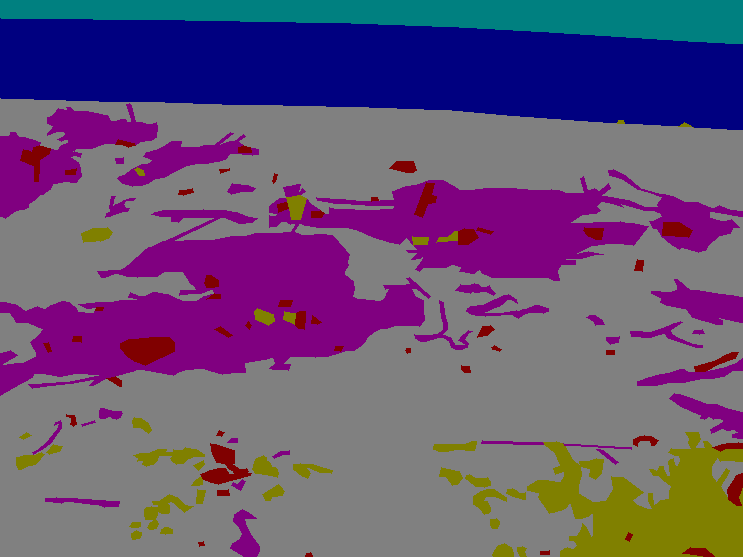

In [92]:
ma.convert(mode="RGB")

- make a function that maps integers to RGB vectors... for each pixel.

In [ ]:
#are they actually different? 
ma == ma.convert(mode='RGB')

False

In [83]:

ma.getpixel((5, 0)), ma.convert(mode='RGB').getpixel((5, 0)), maar.shape

(6, (0, 128, 128), (557, 743, 1))

In [88]:
conversion = dict()
for row in range(50): #maar.shape[0]): 
    for column in range(70): #maar.shape[1]):         
        conversion[ma.getpixel((row, column))] = ma.convert(mode='RGB').getpixel((row, column))
conversion

{6: (0, 128, 128), 4: (0, 0, 128)}

That is extremely slow. 

I give up. I can just use the arrays as masks, as demonstrated above. 

## 2) Questions: 

### 2.1) Are the mask labels 0 through 7 or 1 through 8 ?

In [93]:
maar[:, 200,0].min(), maar[:, 200,0].max()

(1.0, 7.0)

If the labels are 1 through 8, then this particular image does not have label 8 in any pixel.

In [94]:
# Question: are there any zeros? This array might not have a zero, but another image's array might.
mms = []
for i in range(150,170):
    ma = PIL.Image.open(masks[i])
    maar = tf.keras.utils.img_to_array(
        ma, data_format=None, dtype='float64')
    mins = []
    for r in range(maar.shape[0]):
        mins.append(min(maar[r,:,0]))
        if min(mins) == 0:
            break
    mms.append(min(mins))
print(min(mms))

1.0


In [95]:
# Question: are there any eights? This array might not have an 8, but another image's array might.
mms = []
for i in range(0,20):
    ma = PIL.Image.open(masks[i])
    maar = tf.keras.utils.img_to_array(
        ma, data_format=None, dtype='float64')
    maxs = []
    for r in range(maar.shape[0]):
        maxs.append(max(maar[r,:,0]))
        if max(maxs) == 8:
            break
    mms.append(max(maxs))
print(max(mms))

8.0


#### Answer: 1 through 8. 
I may need to modify this to make it work with one hot encoding of the classes. 

## 3) Image Pre-Processing for Deep Learning

To put images into MobileNetV2, I will partially follow the exaple of <a href="https://twitter.com/nikhilroxtomar">Nikhil Tomar</a> in his <a href="https://www.youtube.com/watch?v=kXsBbDGUbpw"> youtube video</a> under the alias IdotDeveloper. However, I am using the PIL library, not cv2 because Hadika et al said they used PIL, and I'd like the masking to agree as much as possible. 

### To Do:
1. Sort paths to files:
    - train-val-test split with file names
2. parse image and mask simultaneously (meaning go from filepath to array)
    - PIL.Image.open().resize() with image_to_array
    - normalize images and masks:
        - bring all images to the same size
        - normalize images by dividing by 255 (ML conventional)
3. collect the images into tensorflow datasets 
    - things like string need special treatment. 

### 3.1. Sort paths to files

In [96]:
#train test split before loading images
# that is, this separates out train_val_test by file paths

from sklearn.model_selection import train_test_split

def sort_paths(path, split=0.1):
    # PATH = "gs://dmcherney/beachlitter/"
    # glob(file_pattern) gives a list of strings satisfying the pattern
    images = sorted(glob(os.path.join(path, "images/*")))
    masks = sorted(glob(os.path.join(path, "maskpngs/*")))

    total_size = len(images)
    valid_size = int(split * total_size)
    test_size = int(split * total_size)
    
    #shuffle with the same random seed to make sure masks stay with images. 
    # USE THE SAME RANDOM SEED EVERY TIME
    train_x, valid_x = train_test_split(images, test_size=valid_size, random_state=42)
    train_y, valid_y = train_test_split(masks, test_size=valid_size, random_state=42)

    train_x, test_x = train_test_split(train_x, test_size=test_size, random_state=42)
    train_y, test_y = train_test_split(train_y, test_size=test_size, random_state=42)

    return (train_x, train_y), (valid_x, valid_y), (test_x, test_y)

(train_x, train_y), (valid_x, valid_y), (test_x, test_y) = sort_paths(path)

#next line shows that sort_paths has created lists of paths to files
train_x[0], train_y[0], type(train_x), type(train_x[0])

('../beachlitter/images/000711.jpg',
 '../beachlitter/maskpngs/000711.png',
 list,
 str)

In [97]:
print("Training data: ", len(train_x))
print("Validation data: ", len(valid_x))
print("Testing data: ", len(test_x))

Training data:  2800
Validation data:  350
Testing data:  350


Now that the split is done.. 

### 3.2. Parse

2. parse image and mask simultaneously (meaning go from filepath to array)
    - PIL.Image.open().resize() with image_to_array
    - normalize images 
        - bring all images to the same size, 128x128 to start to match mobilenetv2
        - normalize images by dividing by 255 (conventional)
    - normalize masks
        - change labels 1-8 to 0-7
        - one hot encode

#### 3.2.1) One hot encode label experiments

In [98]:
from tensorflow.keras.utils import to_categorical #one hot encodes

# Image indexed by 2 had max label value of 8, found above
IMAGE_SIZE = 256
ma1 = PIL.Image.open(masks[1]).resize((IMAGE_SIZE,IMAGE_SIZE))
ma2 = PIL.Image.open(masks[2]).resize((IMAGE_SIZE,IMAGE_SIZE))
ma1 = tf.keras.utils.img_to_array(ma1, data_format=None, dtype='float32')
ma2 = tf.keras.utils.img_to_array(ma2, data_format=None, dtype='float32')
ma1[:,:,0] -= 1
ma2[:,:,0] -= 1
y1_ohe = to_categorical(ma1[:,:,0], dtype='float32') #array of float 64s, was float 32s. oops. 
y2_ohe = to_categorical(ma2[:,:,0], dtype='float32') #array of float 64s, was float 32s. oops. 
y1_ohe.shape,   y2_ohe.shape

((256, 256, 7), (256, 256, 8))

I have sucssfully one hot encoded each pixel of TWO masks! But... 

**NOTE BENE** The number of components of a one hot encoding is, by default, by the number of labels in an image: so, if a particular image has less than 8 categories appearing in the image then the one hot encoding does not give an 8 component pixel. Thus, the one hot encoding will need to be forced to have 8.  

In [99]:
# Image indexed by 2 had max label value of 8, found above
IMAGE_SIZE = 256
ma = PIL.Image.open(masks[1]).resize((IMAGE_SIZE,IMAGE_SIZE))
ma = tf.keras.utils.img_to_array(ma, data_format=None, dtype='float32')
ma[:,:,0] -= 1

y_ohe = to_categorical(ma[:,:,0], dtype='float32',num_classes=8)
y_ohe.shape

(256, 256, 8)

##### Consistancy Concern: 
If one of the labels is missing from an image, is it one hot encoded differently than an image with all 8? The keras function argmax, which picks out the index of the component with the largest value, can help answer this. 

In [100]:
from tensorflow.keras import backend as K

In [101]:
np.array(K.argmax([0,0,0,1,0,0,0]))

2022-04-18 00:15:28.398452: I tensorflow/core/common_runtime/process_util.cc:146] Creating new thread pool with default inter op setting: 2. Tune using inter_op_parallelism_threads for best performance.


array(3)

In [102]:
( ma[:,:,0]  != np.array(K.argmax(y_ohe[:,:,:])) ).sum()

0

In [ ]:
(ma1[:,:,0] != np.array(K.argmax(y1_ohe[:,:,:]))).sum()

0

In [104]:
(ma2[:,:,0] != np.array(K.argmax(y2_ohe[:,:,:]))).sum()

0

In [105]:
ma[:100,4,0]

array([5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5.,
       5., 5., 5., 5., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2.,
       2., 2., 2., 2., 2., 6., 6., 6., 6., 6., 6., 6., 6., 6., 6., 6., 6.,
       6., 6., 6., 6., 6., 6., 6., 6., 6., 6., 6., 6., 6., 6., 6., 6., 6.,
       6., 6., 6., 6., 6., 6., 6., 6., 6., 6., 6., 6., 6., 6., 6., 6., 6.,
       6., 6., 6., 6., 6., 6., 6., 6., 6., 6., 6., 6., 6., 6., 6.],
      dtype=float32)

In [106]:
unique_labels = set()
for i in range(ma1.shape[0]):
    unique_labels = unique_labels.union(set(ma[:,0,0]) )
unique_labels

{2.0, 4.0, 5.0, 6.0}

In [107]:
unique_labels = set()
for i in range(ma2.shape[0]):
    unique_labels = unique_labels.union(set(ma2[:,0,0]) )
unique_labels

{3.0, 4.0, 5.0, 6.0}

In [108]:
# CAUTION: this cell takes some time to run. 
# I feel the urge to make sure that 
# IMAGE_SIZE = 256
# for i in range(3500):
#     ma = PIL.Image.open(masks[i]).resize((IMAGE_SIZE,IMAGE_SIZE))
#     ma = tf.keras.utils.img_to_array(ma, data_format=None, dtype='float32')
#     ma[:,:,0] -= 1
#     y_ohe = to_categorical(ma[:,:,0],num_classes=8, dtype='float32')
#     if y_ohe.shape[2] !=8 or ( ma[:,:,0]  != np.array(K.argmax(y_ohe[:,:,:])) ).sum() !=0: 
#         print(f'Panic at {i}')

So, with passing the parameter 8 to the argument num_classes fixes the issue of non-uniform shape via 1-hot encoding through tf's to_categorical

### 3.3) Collect images and masks into tensorflow dataset 
Tensorflow has a type, tf.data.Dataset that is optimized for building data pipelines. As I understand it, tf is able to examine the pipeline before running computation intensive code to optimize performance. 

Below, I will construct a pipeline for going from image paths to tensors. 
0. Filepaths in lists for train, val, and test sets
1. "Read" the images and masks using pil to open and the keras utility img to array to get tensors, and normalize
2. go from np arrays to ft tensors
3. Collect the tensors in a dataset

#### 3.3.1) Read Images from path to array

In [109]:
IMAGE_SIZE = 224

def read_image(path): #takes in a path, gives out a np array
    path = path.decode() # neede because this function is in a tf pipe
    # open image
    im = PIL.Image.open(path).resize((IMAGE_SIZE,IMAGE_SIZE))
    # image to tensor
    im = tf.keras.utils.img_to_array(im, data_format=None, dtype='float32')
    # normalize image
    im = im/255.
    return im

def read_mask(path):
    path = path.decode() # neede because this function is in a tf pipe
    # open mask
    ma = PIL.Image.open(path).resize((IMAGE_SIZE,IMAGE_SIZE))
    # mask to tensor
    ma = tf.keras.utils.img_to_array(ma, data_format=None, dtype='float32')
    # change catagory numbers from 1 to 8 into 0 to 7
    ma[:,:,0] -= 1
    # one hot encode
    ma = to_categorical(ma[:,:,0],num_classes=8, dtype='float32')
    return ma

#### 3.3.2) Arrays to tensorflow tensors 

In [110]:
# arrays to tensorflow tensors:
def tf_parse(x, y): # takes in 2 paths, not lists
    def _parse(x, y): # takes in 2 paths
        x = read_image(x) 
        y = read_mask(y)
        return x, y # gives out 2 np.arrays

    x, y = tf.numpy_function(_parse, [x, y], [tf.float32, tf.float32]) #takes in 2 paths, gives out 2 tf.tesors
    x.set_shape([IMAGE_SIZE, IMAGE_SIZE, 3]) # seems redundant, but for now it it s bouble check
    y.set_shape([IMAGE_SIZE, IMAGE_SIZE, 8])
    return x, y # tf.tesors 

#### 3.3.3) Tensors to Tensorflow Datasets

In [114]:
# get tf dataset of tf tensors
def tf_dataset(x, y, batch=8): #takes in x : list of paths, y : list of paths
    dataset = tf.data.Dataset.from_tensor_slices((x, y))
    dataset = dataset.map(tf_parse)
    dataset = dataset.batch(batch)
    dataset = dataset.repeat()
    return dataset

train_dataset = tf_dataset(train_x, train_y) # input: lists of filenames . Output: to batched tf datasets of parsed images
valid_dataset = tf_dataset(valid_x, valid_y)

In [112]:
train_dataset.element_spec # Looks like the tensors are the right shape, but.... the model says they should be of shape (none, *this_shape)

(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
 TensorSpec(shape=(None, 224, 224, 8), dtype=tf.float32, name=None))

In [115]:
print("Training data: ", len(train_x))
print("Validation data: ", len(valid_x))
print("Testing data: ", len(test_x))

Training data:  2800
Validation data:  350
Testing data:  350


## 4) Set Up The Deep Neural Network Model

I will use the netrowk architecture called U-Net. 

I will use the pre-trained network model called MobileNetv2 to minimize the training I need to do on the model. I use this model because it is optimized for use on mobile devices, and I hope to launch TrashNet on mobile devices. 

In [117]:
# Ingredients 
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Conv2D, Activation, BatchNormalization
from tensorflow.keras.layers import UpSampling2D, Input, Concatenate
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.metrics import Recall, Precision
from tensorflow.keras import backend as K

In [118]:
# This is the pre-trained network I'll use:
from tensorflow.keras.applications import MobileNetV2 

### 4.1) Explore the pre-trained model, MobileNetV2

I am a little unclear on why Idiot Developer wrote his model function when the pre-trained NN was already in place. I suspect he did it to
- change the connections between layers
- eliminate some of the layers toward the end that were inappropriate for his task. 

To faciliutate exploration `pre_trained` is the pre-trained model straight out of the package, while `model` is Idiot Developer's model. 

In [119]:
# get pre_trained
inputs = Input(shape=(IMAGE_SIZE, IMAGE_SIZE, 3), name="input_image")
mn_with_top = MobileNetV2(input_tensor=inputs, 
                          weights="imagenet", # specifies the pre-trained, as opposed to randomly initialzed, version
                          include_top=True, # specifies to include the original output layers
                          alpha=0.35)
mn_without_top = MobileNetV2(input_tensor=inputs, 
                             weights="imagenet", 
                          include_top=False, # a version without output layers
                             alpha=0.35)

In [120]:
#get model, as modified by Nikhil Tomar

def model():
    inputs = Input(shape=(IMAGE_SIZE, IMAGE_SIZE, 3), name="input_image")
    
    # the pre-trained encoder
    encoder = MobileNetV2(input_tensor=inputs, weights="imagenet", include_top=False, alpha=0.35)
    encoder.trainable =False
    skip_connection_names = ["input_image", "block_1_expand_relu", 
                             "block_3_expand_relu", "block_6_expand_relu"]
    encoder_output = encoder.get_layer("block_13_expand_relu").output
    # output of encoder is 16x16 
    
    # the decoder follows
    f = [16, 32, 48, 64] # the numbers of filters to use in skips traveling UP the U 
    x = encoder_output
    for i in range(1, len(skip_connection_names)+1, 1):
        x_skip = encoder.get_layer(skip_connection_names[-i]).output
        x = UpSampling2D((2, 2))(x)
        x = Concatenate()([x, x_skip])
        
        x = Conv2D(f[-i], (3, 3), padding="same")(x)
        x = BatchNormalization()(x)
        x = Activation("relu")(x)
        
        x = Conv2D(f[-i], (3, 3), padding="same")(x)
        x = BatchNormalization()(x)
        x = Activation("relu")(x)
        
    # output layer:
    # old version had one class, thus one filter:
    # x = Conv2D(1, (1, 1), padding="same")(x)
    # x = Activation("sigmoid")(x)
    x = Conv2D(8, (1, 1), padding="same")(x)
    x = Activation("softmax")(x)

    
    model = Model(inputs, x) # object created
    return model # object returned

model = model() #lower case because I'm calling the function in the above cell.

In [121]:
model.summary(show_trainable=True)

Model: "model"
_____________________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     Trainable  
 input_image (InputLayer)       [(None, 224, 224, 3  0           []                               N          
                                )]                                                                           
                                                                                                             
 Conv1 (Conv2D)                 (None, 112, 112, 16  432         ['input_image[0][0]']            N          
                                )                                                                            
                                                                                                             
 bn_Conv1 (BatchNormalization)  (None, 112, 112, 16  64          ['Conv1[0][0]']                  N      

#### 4.1.1) Notes on the layers: 

First, how many layers in each? 

In [122]:
len(mn_with_top.layers), len(mn_without_top.layers), len(model.layers)

(156, 154, 153)

I see that 
- the last **two** layers are removed when the option `include_top=False` 
- Tomar's model somehow has one layer less than the pre-trained model base that he uses. This is hard to understand: don't we wanto to remove those two layers, which were specialized for one tast, and put back in two layers that are appropriate for our task? That is what I understood to be the recommended approach from Challet, Section 8.3, Leverdging a Pre-Trained Model. 

#### 4.1.2) Questions about the layers

So.... I'm left with questions:
1. What is the structure of the pre-trained model's top layers, and why? In the sense of what was their original task. 
2. How did Tomar end up with one less layer than the truncated model? And what are the final layers that I should be training to follow Challet? 

##### 4.1.2.1) Origin of MobileNet's Top Layers? Unanswered

Lets take a look at those top layers.

In [123]:
mn_with_top.summary()

Model: "mobilenetv2_0.35_224"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_image (InputLayer)       [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 112, 112, 16  432         ['input_image[0][0]']            
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 112, 112, 16  64          ['Conv1[0][0]']                  
                                )                                              

With `include_top = false `
- 153 layers
- first layer is input_image (InputLayer)    (None, 224, 224, 3  0
- last layer is out_relu (ReLU)              (None, 7, 7, 1280)   0 

With `include top = True `

- first layer is input_image (InputLayer), shape  (None, 224, 224, 3) , 0
- 156 total layers
- last layers are

|Layer (type)            |      Output Shape                  |Param #| Connected to      | Trainable?|
|               ---      |                                --- |   ---   |               --- |        |
|out_relu (ReLU)          |            (None, 7, 7, 1280)      |  0      |  'Conv_1_bn[0][0]'| Y |
|global_average_pooling2d |(GlobalAveragePooling2D)(None, 1280)|      0  | 'out_relu[0][0]'  | Y |
|predictions (Dense)      |      (None, 1000)                  |1,281,000| 'global_average_pooling2d[0] | Y |
    

**Partial Answer:**
MobilenetV2 was trained to on a multiclass-object location task with 1,000 categories of objects, as defined in <a href="https://www.image-net.org/challenges/LSVRC/2017/index.php#loc">ImageNet competition, 2017.</a>. Acually it seems it was trained for many tasks... hard to sort out. 

Thus, the reason that the output layer was 1000 components is that ... seems like the entire image is being classified into on of 1000 classes. 

I still do not understand how an output of 1000 numbers can give classification in 1000 classes AND localization... 

Thus, I do not want the global pooling OR the predictions layer (good because it is the vast majority of the parameters. 

### 4.2) Explore Nikhil's modification of the model
put an ouput of the right size for segmentation into this model? Unanswered.

The last layers of Nikhil's (with my modification) model do not include the out_relu, (7,7,1280) layer of MoblieNet. 

|Layer (type)                               |      Output Shape  |Param #|Connected to      |  Trainable?|
|                                       --- |                --- |   --- |              --- |        --- |
| batch_normalization_7 (BatchNormalization)|(None, 224, 224, 16)| 64    |['conv2d_7[0][0]']|          Y |
|activation_7 (Activation)                  |(None, 224, 224, 16 | 0     |['batch_normalization_7[0][0]'] | Y| 
|conv2d_8 (Conv2D)          |    (None, 224, 224, 8)  |136    |     ['activation_7[0][0]']   |        Y       |  
|activation_8 (Activation)     | (None, 224, 224, 8) | 0    |       ['conv2d_8[0][0]']       |        Y        |  

<a href="https://twitter.com/nikhilroxtomar">Nikhil Tomar,</a> used the output layers
```python
x = Conv2D(1, (1, 1), padding="same")(x)
x = Activation("sigmoid")(x)
```

because he was doing a binary segmentation task: regular colon tissue vs irregular colon tissue. I have changed the code to be appropriate for 8 category classification by changing one number;
```python
x = Conv2D(8, (1, 1), padding="same")(x)
x = Activation("sigmoid")(x)
```

Despite my ability to manipulate the model, I do not understand how Nikhil has modified the layers. A side by side comparison of the layers shows that he changed the shapes ov virtually every layer on the upsampling side of the U-Net. 

Frankly, I do not understand Nikhil's  `Conv2D(1, (1, 1), padding="same")(x)` layer, which I modified. 

According to the keras <a href="https://keras.io/api/layers/convolution_layers/convolution2d/">documentation</a>, the layer Conv2D has two positional arguments

- `filters`: Integer, the dimensionality of the output space (i.e. the number of output filters in the convolution).
- `kernel_size`: An integer or tuple/list of 2 integers, specifying the height and width of the 2D convolution window. Can be a single integer to specify the same value for all spatial dimensions.

Thus, the lone 1 here is a number of filters, and the tuple (1,1) is presumably sayin the kernel size is 1 by 1, leading to effectively a pixel-wise output. 
on task.   

keras has a metod to show the computation graph of a model. It is so big that it is pretty pointless here, but I'd still like to show it. 

In [126]:
# Plots the computational graph of the model. Too complicated to be enlighening. 
# tf.keras.utils.plot_model(model,
#                           to_file = "images/model_graph.png", 
#                           show_shapes = True,
#                           show_dtype=True,
#                           show_layer_names=True,
#                           show_layer_activations= True
#                          )

<img src="../images/model_graph.png">

#### 4.2.1) How to freeze layers

By default, layers are trainable when the pre-trained model is imporeted. You can set all of them to trainable at once.

In [127]:
model.trainable = True
model.summary(show_trainable=True) 

Model: "model"
_____________________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     Trainable  
 input_image (InputLayer)       [(None, 224, 224, 3  0           []                               Y          
                                )]                                                                           
                                                                                                             
 Conv1 (Conv2D)                 (None, 112, 112, 16  432         ['input_image[0][0]']            Y          
                                )                                                                            
                                                                                                             
 bn_Conv1 (BatchNormalization)  (None, 112, 112, 16  64          ['Conv1[0][0]']                  Y      

You can also set individual layers to be not-trainable. 

In [128]:
for layer in model.layers[:-2]:
    layer.trainable = False

model.summary(show_trainable=True) 

Model: "model"
_____________________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     Trainable  
 input_image (InputLayer)       [(None, 224, 224, 3  0           []                               N          
                                )]                                                                           
                                                                                                             
 Conv1 (Conv2D)                 (None, 112, 112, 16  432         ['input_image[0][0]']            N          
                                )                                                                            
                                                                                                             
 bn_Conv1 (BatchNormalization)  (None, 112, 112, 16  64          ['Conv1[0][0]']                  N      

#### 4.2.2) How Nikhil's model is intended to be used.

In his video, Nikhil says that the encoder side is meant to be frozen, while the decoder side (which he modified) is meant to be trainable. This is somewhat in line with Chollet's advice to train only the last layers on the novel task. 

Thus, the model should be defined as follows.

In [129]:
#get model

def model():
    inputs = Input(shape=(IMAGE_SIZE, IMAGE_SIZE, 3), name="input_image")
    
    # the pre-trained encoder
    encoder = MobileNetV2(input_tensor=inputs, weights="imagenet", include_top=False, alpha=0.35)
    encoder.trainable=False
    skip_connection_names = ["input_image", "block_1_expand_relu", 
                             "block_3_expand_relu", "block_6_expand_relu"]
    encoder_output = encoder.get_layer("block_13_expand_relu").output
    # output of encoder is 16x16 
    
    # the decoder follows
    f = [16, 32, 48, 64] # the numbers of filters to use in skips traveling UP the U 
    x = encoder_output
    for i in range(1, len(skip_connection_names)+1, 1):
        x_skip = encoder.get_layer(skip_connection_names[-i]).output
        x = UpSampling2D((2, 2))(x)
        x = Concatenate()([x, x_skip])
        
        x = Conv2D(f[-i], (3, 3), padding="same")(x)
        x = BatchNormalization()(x)
        x = Activation("relu")(x)
        
        x = Conv2D(f[-i], (3, 3), padding="same")(x)
        x = BatchNormalization()(x)
        x = Activation("relu")(x)
        
    # output layer:
    # old version had one class, thus one filter:
    # x = Conv2D(1, (1, 1), padding="same")(x)
    # x = Activation("sigmoid")(x)
    x = Conv2D(8, (1, 1), padding="same")(x)
    x = Activation("softmax")(x)

    
    model = Model(inputs, x) # object created
    return model # object returned

model = model() #lower case because I'm calling the function in the above cell.

Note that only the trainable layers are on the upsampling side.

In [130]:
model.summary(show_trainable=True)

Model: "model_1"
_____________________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     Trainable  
 input_image (InputLayer)       [(None, 224, 224, 3  0           []                               N          
                                )]                                                                           
                                                                                                             
 Conv1 (Conv2D)                 (None, 112, 112, 16  432         ['input_image[0][0]']            N          
                                )                                                                            
                                                                                                             
 bn_Conv1 (BatchNormalization)  (None, 112, 112, 16  64          ['Conv1[0][0]']                  N    

### 4.2.3) Count of Parameters
Freezing the encoding parameters reduces the number of trainable parameters from $409,144$ to $317,176$. That is a reduction of $91,968$

### 4.2.4) A test epoch

In [131]:
# compile with options
LR = 1e-4 #learning rate
opt = tf.keras.optimizers.Nadam(LR)
# metrics = [dice_coef, Recall(), Precision()]
model.compile(loss='categorical_crossentropy', optimizer=opt, metrics=['accuracy'])

BATCH = 8
train_steps = len(train_x)//BATCH
valid_steps = len(valid_x)//BATCH
callbacks_list = [
    ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=4),
    EarlyStopping(monitor='val_loss', 
                  patience=10, 
                  restore_best_weights=True # I think that lets me save the model.
                 )
]

res = model.fit(
    train_dataset, # this actas as both X and y
    validation_data=valid_dataset,
    epochs=1,
    steps_per_epoch=train_steps,
    validation_steps=valid_steps,
    callbacks=callbacks_list
)

350/350 [==============================] - 550s 2s/step - loss: 1.2186 - accuracy: 0.6812 - val_loss: 0.8961 - val_accuracy: 0.8137 - lr: 1.0000e-04


In [132]:
res.history.keys()

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy', 'lr'])

In [133]:
res.history['val_accuracy']

[0.8137192726135254]

## 4.3) Saving and Loading Models I trained

#### 4.3.1) Kera's `model.save`
The modern way to save files is with the simple save method of keras objects from the Model class. 

In [134]:
model.save('saved_models/test')

2022-04-18 00:36:27.501734: W tensorflow/python/util/util.cc:368] Sets are not currently considered sequences, but this may change in the future, so consider avoiding using them.


INFO:tensorflow:Assets written to: saved_models/test/assets


In [135]:
# Loading a saved model for further development: 
from tensorflow import keras
model_c = keras.models.load_model('saved_models/test') #I do not remember which model this was. 

In [ ]:
# after loading the model, I can rtrain on more epochs, starting where I left off.
res = model_c.fit(
    train_dataset, # this actas as both X and y
    validation_data=valid_dataset,
    epochs=1,
    steps_per_epoch=train_steps,
    validation_steps=valid_steps,
    # callbacks=callbacks_list
)

#### 4.3.2) h5py format

Since Streamlit does not like pickled keras, and does not seem to be able to handle the complexity of the new keras model format, I need to try this format.

In [141]:
model.save("../saved_models/test/model.h5") # I'll separate the models by folder

In [142]:
reconstructed_model = keras.models.load_model("../saved_models/test/model.h5")

#### 4.3.3) Pickle's binary methods

In [138]:
import pickle

In [143]:
pickle.dump(model, open('../saved_models/test/model.p', 'wb'))

INFO:tensorflow:Assets written to: ram://4cad2cd2-48f9-4f84-86fa-3f8d301850da/assets


In [145]:
with open('../saved_models/test/model.p', 'rb') as f:
    model = pickle.load(f)

Unfortunately, while this does work, it does not work with streamlit without importing tensorflow, which I cannot do on my local machine, and I can not figure out how to do on GCP. I figured out how to run streamlist from github, but the h5py format worked while the pickled format did not. 

#### 4.3.4) saving training scores to csv

In [146]:
import pandas as pd

scores= pd.DataFrame(data=res.history) # keras likely made it this easy on purpose
 
scores.to_csv('../saved_models/test/test.csv')

In [147]:
scores = pd.read_csv('../saved_models/test/test.csv' )
del scores['Unnamed: 0']

For when you run further training epochs:

In [ ]:
# scores = pd.concat([scores,pd.DataFrame(data=res.history)])
# scores # index now repeats.

# scores.reset_index(inplace=True)

# 5) Visualizing results

From which model?

In [148]:
model_frozen_encoder = keras.models.load_model('../saved_models/train_with_frozen_encoder/')

This is the best model I created. 

## 5.1) Plot Masks

I need these two functions from the data pipeline for visualization of arrays, but without the decoding used for  tf computation graphs, so I will rename them with _p for post, predict, whatever.

In [149]:
# need these two functions, but without the decoding, which was for tf pipelining
# so I will rename them with _p for post, predict, whatever
def read_image_p(path): #takes in a path, gives out a np array
    # path = path.decode() # neede because this function is in a tf pipe
    # open image
    im = PIL.Image.open(path).resize((IMAGE_SIZE,IMAGE_SIZE))
    # image to tensor
    im = tf.keras.utils.img_to_array(im, data_format=None, dtype='float32')
    # normalize image
    im = im/255.
    return im

def read_mask_p(path):
    # path = path.decode() # neede because this function is in a tf pipe
    # open mask
    ma = PIL.Image.open(path).resize((IMAGE_SIZE,IMAGE_SIZE))
    # mask to tensor
    ma = tf.keras.utils.img_to_array(ma, data_format=None, dtype='float32')
    # change catagory numbers from 1 to 8 into 0 to 7
    ma[:,:,0] -= 1
    # one hot encode
    ma = to_categorical(ma[:,:,0],num_classes=8, dtype='float32')
    return ma

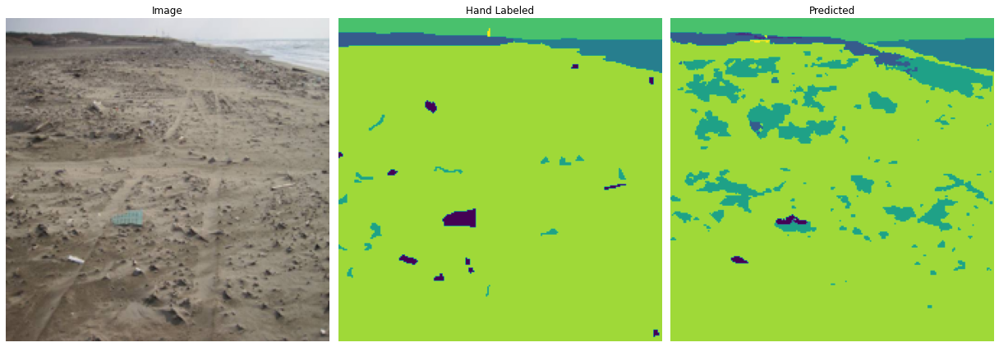

In [150]:
index = 9

fig = plt.figure(figsize=(17, 15))
fig.add_subplot(1, 3, 1 )
plt.title('Image')
plt.axis('off');
plt.imshow(read_image_p(test_x[index]))
fig.add_subplot(1, 3, 2) 
plt.imshow(np.reshape(K.argmax( read_mask_p(test_y[index]),axis=-1) +1, (224,224,1) ) )
plt.title('Hand Labeled');
plt.axis('off');
fig.add_subplot(1, 3,3)
pred = model_frozen_encoder.predict(np.expand_dims(read_image_p(test_x[index]), axis=0))
plt.imshow(np.reshape( K.argmax(pred[0,:,:,:],            axis=-1)+1   ,(224,224,1) )); # will be 1 to 8
plt.title('Predicted')
plt.axis('off');
plt.tight_layout()
plt.savefig('img_mask_pred.png', transparent=True);

## 5.2) Overlay predicted mask

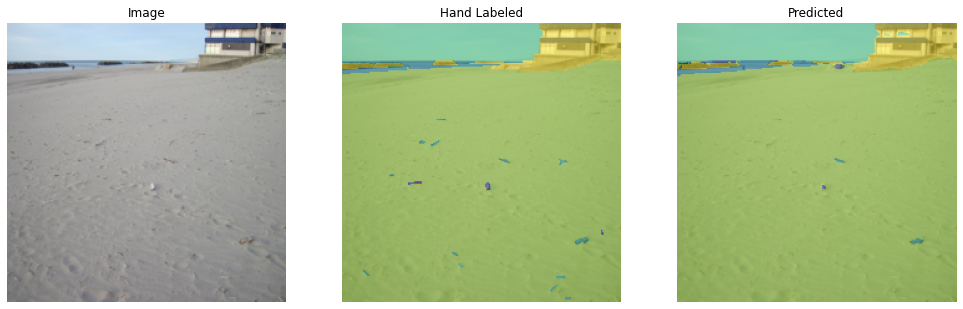

In [151]:
index = 11


fig = plt.figure(figsize=(17, 15))

fig.add_subplot(1, 3, 1 )
plt.title('Image');
plt.axis('off');
plt.imshow(read_image_p(test_x[index]), alpha=1)

fig.add_subplot(1, 3, 2 )
plt.title('Image');
plt.imshow(read_image_p(test_x[index]), alpha=1)
# fig.add_subplot(1, 3, 1) 
plt.imshow(np.reshape(K.argmax( read_mask_p(test_y[index]),axis=-1) +1, (224,224,1) ) , alpha=.5)
plt.axis('off');
plt.title('Hand Labeled')

fig.add_subplot(1, 3,3)
plt.imshow(read_image_p(test_x[index]), alpha=1)
pred = model_frozen_encoder.predict(np.expand_dims(read_image_p(test_x[index]), axis=0))
plt.imshow(np.reshape( K.argmax(pred[0,:,:,:],            axis=-1)+1   ,(224,224,1) ), alpha = .5); # will be 1 to 8
plt.axis('off');
plt.title('Predicted');

## 5.3) Visualize accuracy

I think I can plot the boolean pred = actual

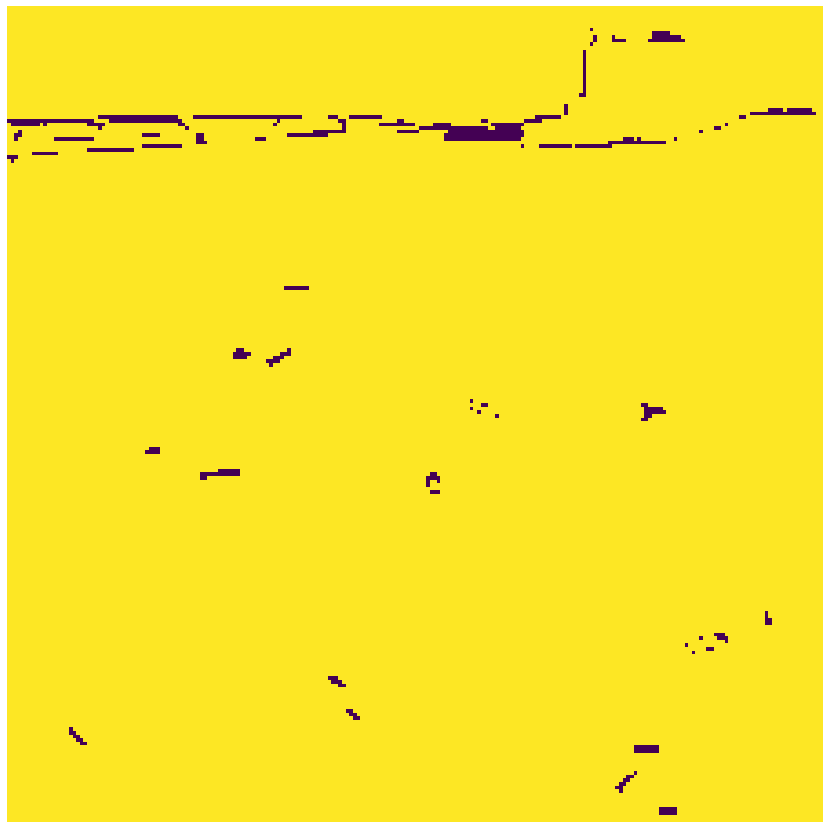

In [153]:
pred_mask_ar = np.reshape( K.argmax(pred[0,:,:,:],axis=-1)+1 ,(224,224,1) )
act_mask_ar = np.reshape(K.argmax( read_mask_p(test_y[index]),axis=-1) +1, (224,224,1) )

fig = plt.figure(figsize=(17, 15))
plt.axis('off')
plt.imshow(pred_mask_ar == act_mask_ar); # the dark pixels are incorrectly predicted. 

## 5.4) All in one

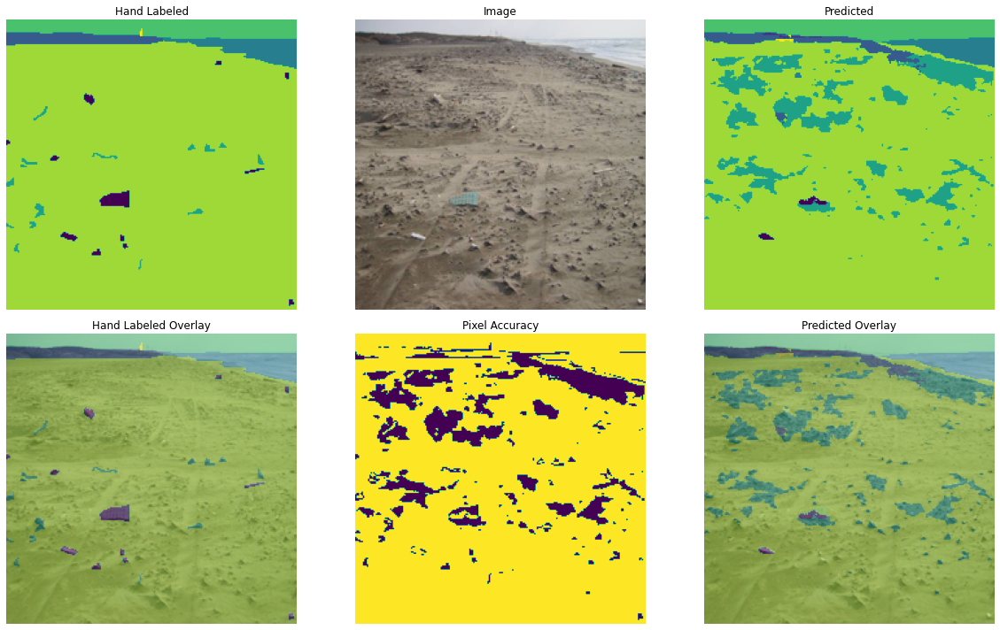

In [154]:
index = 9

fig = plt.figure(figsize=(17, 10))

fig.add_subplot(2, 3, 1) 
plt.axis('off')
plt.imshow(np.reshape(K.argmax( read_mask_p(test_y[index]),axis=-1) +1, (224,224,1) ) )
plt.title('Hand Labeled')

fig.add_subplot(2, 3, 2 )
plt.axis('off')
plt.title('Image')
plt.imshow(read_image_p(test_x[index]))


fig.add_subplot(2, 3,3)
plt.axis('off')
pred = model_frozen_encoder.predict(np.expand_dims(read_image_p(test_x[index]), axis=0))
plt.imshow(np.reshape( K.argmax(pred[0,:,:,:],            axis=-1)+1   ,(224,224,1) )); # will be 1 to 8
plt.savefig('img_mask_pred.png', transparent=True)
plt.title('Predicted')




fig.add_subplot(2, 3, 4 )
plt.title('Image');
plt.imshow(read_image_p(test_x[index]), alpha=1)
# fig.add_subplot(1, 3, 1) 
plt.imshow(np.reshape(K.argmax( read_mask_p(test_y[index]),axis=-1) +1, (224,224,1) ) , alpha=.5)
plt.axis('off');
plt.title('Hand Labeled Overlay')

fig.add_subplot(2, 3, 5 )
pred_mask_ar = np.reshape( K.argmax(pred[0,:,:,:],axis=-1)+1 ,(224,224,1) )
act_mask_ar = np.reshape(K.argmax( read_mask_p(test_y[index]),axis=-1) +1, (224,224,1) )
plt.imshow(pred_mask_ar == act_mask_ar)
plt.axis('off');
plt.title('Pixel Accuracy')

fig.add_subplot(2, 3,6)
plt.imshow(read_image_p(test_x[index]), alpha=1)
pred = model_frozen_encoder.predict(np.expand_dims(read_image_p(test_x[index]), axis=0))
plt.imshow(np.reshape( K.argmax(pred[0,:,:,:],            axis=-1)+1   ,(224,224,1) ), alpha = .5); # will be 1 to 8
plt.axis('off');
plt.title('Predicted Overlay')

plt.tight_layout()
plt.savefig('img_mask_pred_acc.png', transparent=True);

## 5.4) Binary Trash Mask

This shows the viewer where the trash is. 

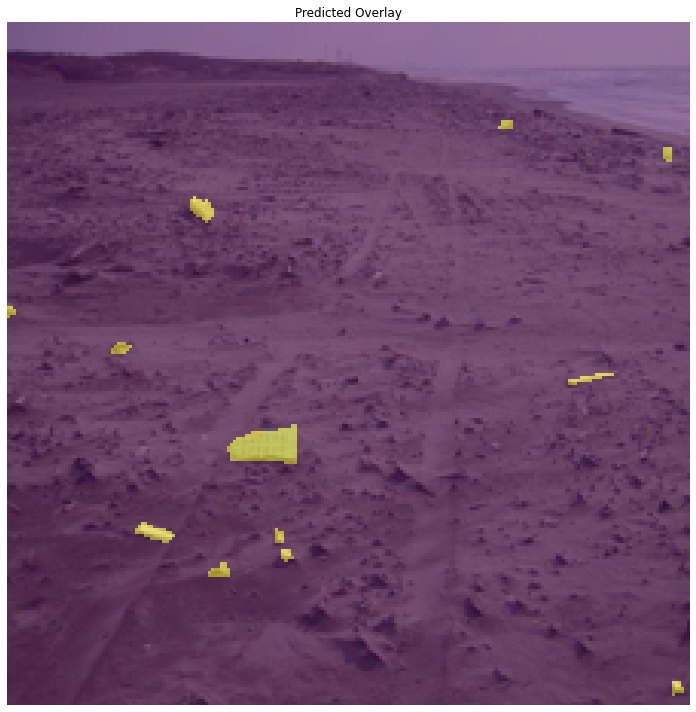

In [155]:
index = 9

act_mask_ar = np.reshape(K.argmax( read_mask_p(test_y[index]),axis=-1) +1, (224,224,1) )
pred = model_frozen_encoder.predict(np.expand_dims(read_image_p(test_x[index]), axis=0))
pred_mask_ar = np.reshape( K.argmax(pred[0,:,:,:],axis=-1)+1 ,(224,224,1) )

fig = plt.figure(figsize=(17, 10))
plt.imshow(read_image_p(test_x[index]), alpha=1)
plt.imshow(act_mask_ar==1 , alpha = .5); # will be 1 to 8
plt.axis('off');
plt.title('Predicted Overlay')
plt.tight_layout();


## 5.5) Higher resolution trash masks
OK, but that is for the 224X224 image versions. For the original versions.... 

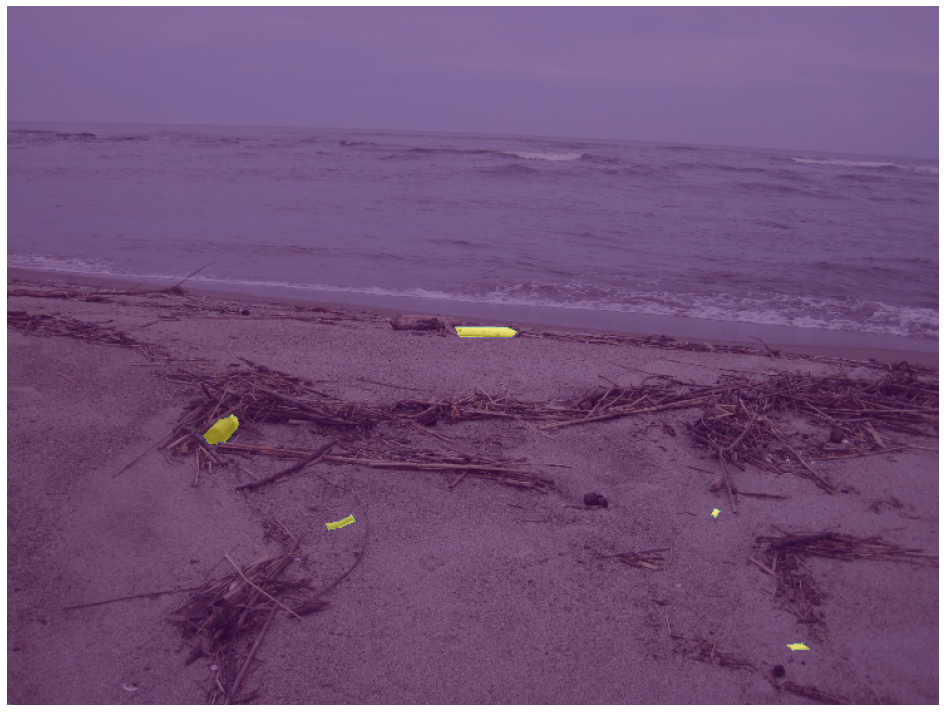

In [157]:
index = 13
fig = plt.figure(figsize=(17, 10))
# fig.add_subplot(1, 1, 1)
# plt.imshow(PIL.Image.open( test_x[index] ), alpha=1)
fig.add_subplot(1, 1, 1)
plt.imshow(PIL.Image.open( test_x[index] ), alpha=1)
ma = PIL.Image.open( test_y[index])
plt.imshow(  tf.keras.utils.img_to_array(ma, data_format=None, dtype='float32')   == 1 , alpha = .5); # will be 1 to 8
plt.axis('off') #plt.title('Predicted Overlay')
plt.tight_layout()
plt.savefig('../images/open_trash_vision.png');
# plt.savefig('images/open_img.png');

# 6) Tensorboard
This is used to monitor training, and is the reason there is a folder my_tensorboard.

## 6.1) Example of tensorboard

In [163]:
from sklearn.datasets import make_regression
from sklearn.model_selection import train_test_split
X,y = make_regression(n_samples = 10_000,n_features=20,)
X_train,X_test,y_train,y_test = train_test_split(X,y,)

from sklearn.preprocessing import StandardScaler
ss = StandardScaler()
X_train_sc = ss.fit_transform(X_train) 
X_test_sc = ss.transform(X_test)

from tensorflow.keras.models import Sequential
model= Sequential()

from tensorflow.keras.layers import Dense
model.add(Dense(32, # the number of neurons in the first hidden layer
                activation='relu', # this is the standard
                input_shape=X_train_sc[0].shape, # the shape of one sample
               name='layer_1', #optional, for keeping track of things
               ))
model.add(Dense(16, activation='relu',name='layer_2'))
model.add(Dense(1,activation='linear', name='outlayer'))
model.compile(loss='mean_squared_error', # a nice choice for regression
              optimizer='adam',
             metrics=['mae','mse'], # I want to monitor these metrics as training progresses
             )

from tensorflow.keras.callbacks import TensorBoard 

%load_ext tensorboard
import tensorflow as tf
import datetime
# Clear any logs from previous runs with the following line
# !rm -rf ./logs/ 


log_dir = "../my_tensorboard/logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
callbacks_list = [TensorBoard(log_dir=log_dir,
                              histogram_freq=1, #for histogram computation each epoc 
                              )]

model.fit(X_train_sc,y_train,
          batch_size=512, 
          epochs=10, # run batches till you have run through all train data, that is one epoch
          validation_data=(X_test,y_test), #we will get a test score for this data after each epoch
          callbacks=callbacks_list,
         verbose=1, 
         )

%tensorboard --logdir ../my_tensorboard/logs/fit

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard
Epoch 1/10
15/15 [==============================] - 1s 32ms/step - loss: 27300.9434 - mae: 132.1906 - mse: 27300.9434 - val_loss: 27680.8125 - val_mae: 133.4715 - val_mse: 27680.8125
Epoch 2/10
15/15 [==============================] - 0s 29ms/step - loss: 27245.5918 - mae: 132.0542 - mse: 27245.5918 - val_loss: 27623.7129 - val_mae: 133.3336 - val_mse: 27623.7129
Epoch 3/10
15/15 [==============================] - 0s 27ms/step - loss: 27182.0156 - mae: 131.8991 - mse: 27182.0156 - val_loss: 27549.2031 - val_mae: 133.1528 - val_mse: 27549.2031
Epoch 4/10
15/15 [==============================] - 0s 26ms/step - loss: 27092.7402 - mae: 131.6777 - mse: 27092.7402 - val_loss: 27436.7871 - val_mae: 132.8775 - val_mse: 27436.7871
Epoch 5/10
15/15 [==============================] - 0s 26ms/step - loss: 26956.7539 - mae: 131.3383 - mse: 26956.7539 - val_loss: 27264.3359 - val_mae: 132.4497 - val_mse: 27264.

I see that tensorboard gives one the tools to look at visulaizations of training at the usual level of loss and metrics, but also at the fine grained level of epoch evolution of weights. I can imagine this being used to see which weights have stopped learning, etc. Good to have on my radar. 

# 7) Efficient data pipeline concerns

The way I have been reading in images with PIL and `image_to_array` MIGHT BE CAUSING a significant slowdown in data processing. Perhaps `tf.keras.utils.image_dataset_from_directory()` is the efficient data pipeline keras creators want me to use. 

The first step is to separate the images into folders for train, val, and test sets. The location in folders is then taken to be the label. Ahh.... this is not for image segmentation. Project aborted.

Here I explore some of the basics of creating a tf dataset. 

In [164]:
# create a dataset from a slice of a tensor
random_numbers = np.random.normal(size=(1000, 16))
random_numbers.shape
dataset = tf.data.Dataset.from_tensor_slices(random_numbers)
for i, element in enumerate(dataset):
    print(element.shape) # each of 1000 data points is 16 comp vector
    if i>=2:
        break

(16,)
(16,)
(16,)


In [165]:
# batch the dataset
batched_dataset = dataset.batch(32)
for i ,element in enumerate(batched_dataset):
    print(element.shape) #each element of batched set is 32 datapoints, each a 16 comp vect
    if i>=2:
        break

(32, 16)
(32, 16)
(32, 16)


In [166]:
# apply a function to the data points
reshaped_data = dataset.map(lambda x: tf.reshape(x,(4,4)))
for i, element in enumerate(reshaped_data):
    print(element.shape) # each 16 comp datapoint has been reshaped into a rank 2 tensor of shape (4,4) 
    if i>=2:
        break

(4, 4)
(4, 4)
(4, 4)


### 7.1) Q: Can I avoid PIL?  A: No.
PIL might be slowing down the data pipeline. Presumably keras tools will be optimized to fit in tf data pipelines. 

In [167]:
from tensorflow.keras.utils import load_img # shoulda done this instead of PIL
from tensorflow.keras.utils import img_to_array


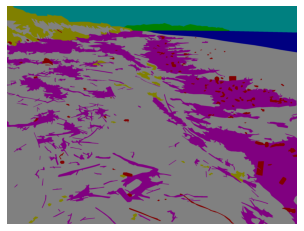

In [170]:
# plt.axis('off')
# plt.imshow(load_img(image_paths[3]));
plt.axis('off')
plt.imshow(load_img(masks[9]));

In [171]:
# normalizing... in hopes of undertansing later things
def display_target(target_array):
    normalized_array =  ((target_array.astype("uint8")-1) *(256/8) )
    plt.axis('off')
    plt.imshow(normalized_array[:,:,0])

for k in range(5):
    img = img_to_array(load_img(masks[k]),data_format=None, dtype='float32' )#,color_mode="grayscale"))
    # display_target(img)
    appears=set()
    for i in range(img.shape[1]):
        appears = appears.union( set(img[:,i,0]/64))

    print(len(appears),sorted(list(appears)))


2 [0.0, 2.0]
2 [0.0, 2.0]
3 [0.0, 1.0, 2.0]
3 [0.0, 1.0, 2.0]
2 [0.0, 2.0]


**answer: No** 

keras's to_array(load_image()) gives out different values than to_array(pilload()). 
Lets check out the details.

**Warning** The next cell takes about 15 seconds to run

In [173]:
%%time
pairs = {}
for i in range(20):
    img = img_to_array(load_img(masks[i],color_mode="grayscale"),data_format=None, dtype='float32')
    ma = img_to_array(PIL.Image.open(masks[i]) ,data_format=None, dtype='float32')
    for r in range(img.shape[0]):
        for c in range(img.shape[1]):
            pairs[img[r,c,0] ] = ma[r,c,0] 
pairs

CPU times: user 16.2 s, sys: 35.6 ms, total: 16.2 s
Wall time: 16.2 s


{90.0: 6.0,
 15.0: 4.0,
 128.0: 7.0,
 53.0: 5.0,
 38.0: 1.0,
 113.0: 3.0,
 75.0: 2.0,
 19.0: 8.0}

The full map apprers to be 
{90.0: 6.0,
 113.0: 3.0,
 38.0: 1.0,
 53.0: 5.0,
 128.0: 7.0,
 15.0: 4.0,
 19.0: 8.0,
 75.0: 2.0}

In [174]:
len(pairs)

8

How do I use that dictionary to quickly map? 

In [175]:
def g_to_i(x):
    return pairs[x]

g_to_iv = np.vectorize(g_to_i)

In [178]:
%%time
g_to_iv(img);

CPU times: user 509 ms, sys: 4.93 ms, total: 514 ms
Wall time: 511 ms


array([[[6.],
        [6.],
        [6.],
        ...,
        [6.],
        [6.],
        [6.]],

       [[6.],
        [6.],
        [6.],
        ...,
        [6.],
        [6.],
        [6.]],

       [[6.],
        [6.],
        [6.],
        ...,
        [6.],
        [6.],
        [6.]],

       ...,

       [[7.],
        [7.],
        [7.],
        ...,
        [7.],
        [7.],
        [7.]],

       [[7.],
        [7.],
        [7.],
        ...,
        [7.],
        [7.],
        [7.]],

       [[7.],
        [7.],
        [7.],
        ...,
        [7.],
        [7.],
        [7.]]], dtype=float32)

That takes 6 seconds for one image. unacceptable. 

**Project aborted.**

# EDA Conclusions: 

My model is
- a modification from 2 classes to 8 of Nikhil's model
    - which is a modification from an 1,000 number output to a pixel wise output of  MobileNetV2
        - which is a update of a 2017 U-Net trained for on ImageNet for a variety of tasks.
            - which was designed to be a lightweight CNN so that it can run on mobile devices. 

It is intended to be trained with the encoder layer frozen, leaving about 300,000 trainable parameters. 